In [1]:
import yaml
# !pip install tensorboardX
from hydra.core.global_hydra import GlobalHydra
from hydra import compose, initialize
from train import train
config = {
    "defaults": [
        "model",
        "training",
        {"dataset": "speech_dataset"}
    ],
    "dataset":{
        "noisy_training_dataset_dir": "/Users/vtokala/Documents/Research/di_nn/Dataset/noisy_trainset_1f",
        "noisy_validation_dataset_dir": "/Users/vtokala/Documents/Research/di_nn/Dataset/noisy_valset_1f",
        "noisy_test_dataset_dir": "/Users/vtokala/Documents/Research/di_nn/Dataset/noisy_testset_1f",
        "target_training_dataset_dir": "/Users/vtokala/Documents/Research/di_nn/Dataset/clean_trainset_1f",
        "target_validation_dataset_dir": "/Users/vtokala/Documents/Research/di_nn/Dataset/clean_valset_1f",
        "target_test_dataset_dir": "/Users/vtokala/Documents/Research/di_nn/Dataset/clean_testset_1f"
#         "target_training_dataset_dir": "/kaggle/input/binauralspeech30db/Clean_trainset_30dB",
#         "target_validation_dataset_dir": "/kaggle/input/binauralspeech30db/Clean_valset_30dB",
#         "target_test_dataset_dir": "/kaggle/input/binauralspeech30db/Clean_testset_30dB"
    },
    "training":{
        "batch_size": 20,
        "n_epochs": 20,
        "n_workers": 4,
        "learning_rate":0.0001,
        "train_checkpoint_path": None, #"/kaggle/working/SE_DCNN/DCNN/checkpoints/weights-epoch=19-validation_loss=-17.90.ckpt",
        "strategy": "ddp_spawn",
        "pin_memory": True,
        "accelerator": "cuda"
    },
    "model":{
        "rtf_weight" : 0,
        "snr_weight" : 1,
        "ild_weight": 1, #0.1,
        "ipd_weight": 10, #10,
        "stoi_weight": 10, #10
        "kurt_weight": 0,
        "avg_mode": "time",
        "attention": True,
        'sdr_weight': 0,
        'mse_weight': 0,
        'si_sdr_weight':0,
        'si_snr_weight':0
    }
}

with open('config/config.yaml', 'w') as f_yaml:
    yaml.dump(config, f_yaml)
GlobalHydra.instance().clear()
initialize(config_path="./config")
config = compose("config")

#train(config)

# !make train

In [4]:
import torch
from DCNN.trainer import DCNNLightningModule

MODEL_CHECKPOINT_PATH = "/Users/vtokala/Documents/Research/di_nn/DCNN/checkpoints/Complex-Attn-SISDR-HPC.ckpt"
# MODEL_CHECKPOINT_PATH = "/kaggle/input/lss-resources/code/se/demo/last.ckpt"
model = DCNNLightningModule(config)
model.eval()
torch.set_grad_enabled(False)
device = torch.device('cpu')
checkpoint = torch.load(MODEL_CHECKPOINT_PATH, map_location=device)
# checkpoint = torch.load(MODEL_CHECKPOINT_PATH)
model.load_state_dict(checkpoint["state_dict"], strict=False)

======================================== Model Structures ========================================
BinauralAttentionDCNN(
  (stft): Stft()
  (istft): IStft()
  (mattn): MultiAttnBlock(
    (mattn): ComplexMultiheadAttention(
      (MultiheadAttention_re): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
      )
      (MultiheadAttention_im): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
      )
    )
    (transform): Linear(in_features=1024, out_features=1024, bias=True)
  )
  (encoder): Encoder(
    (model): ModuleList(
      (0): Sequential(
        (0): ComplexConv2d(
          (conv_r): Conv2d(1, 8, kernel_size=(5, 2), stride=(2, 1), padding=(2, 1))
          (conv_i): Conv2d(1, 8, kernel_size=(5, 2), stride=(2, 1), padding=(2, 1))
        )
        (1): NaiveComplexBatchNorm2d(
          (bn_r): BatchNorm2d(8, eps=1e-05, momentum=0.1, aff

<All keys matched successfully>

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 0 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


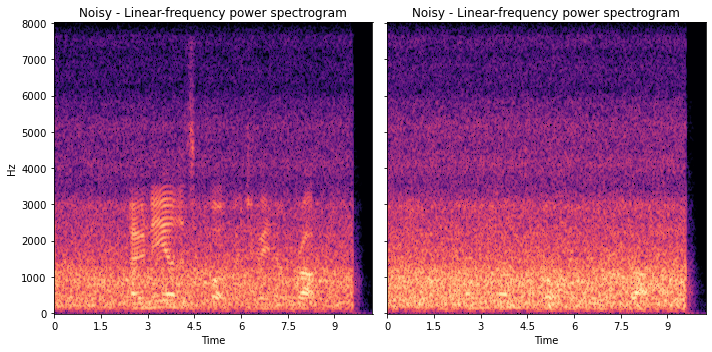

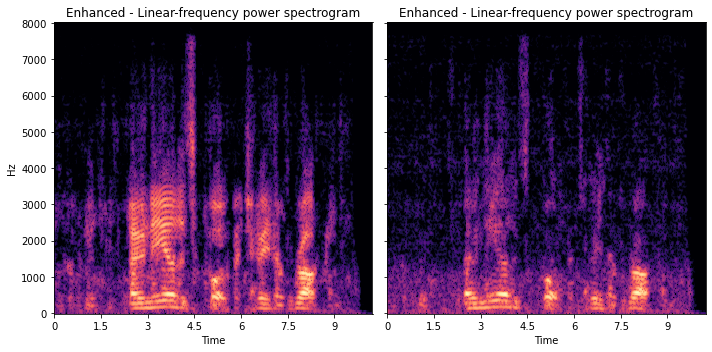

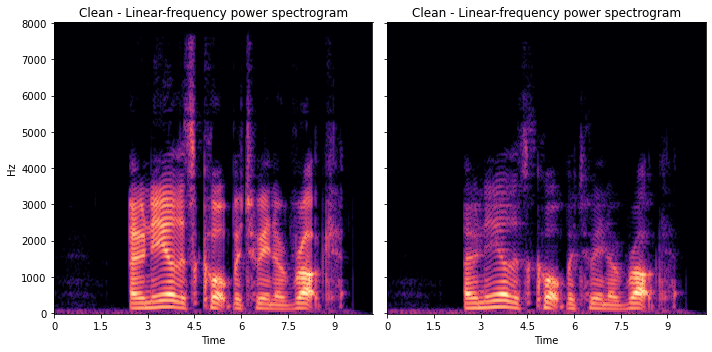

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 1 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


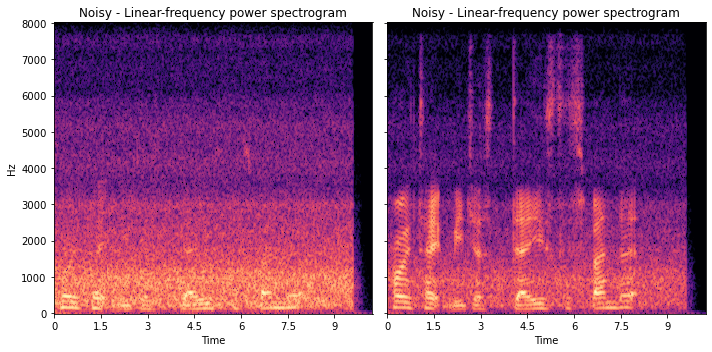

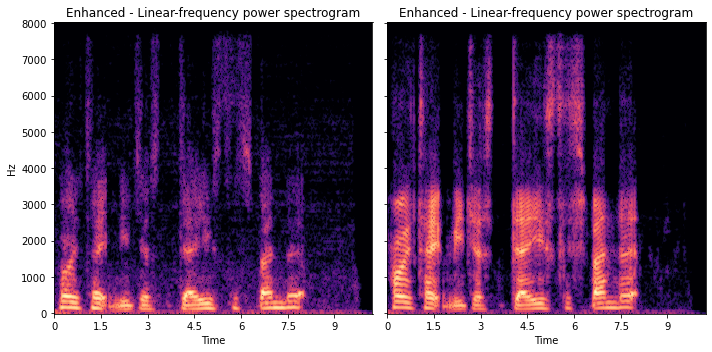

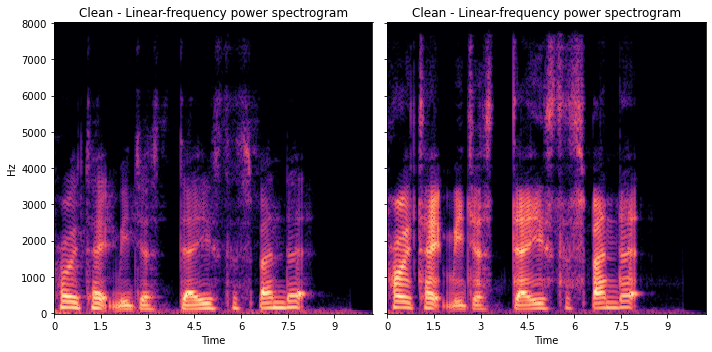

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 2 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


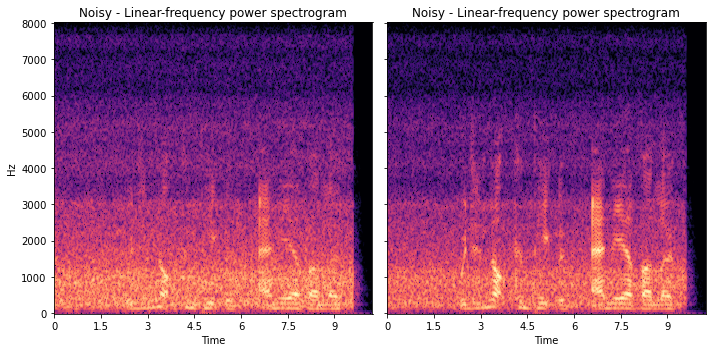

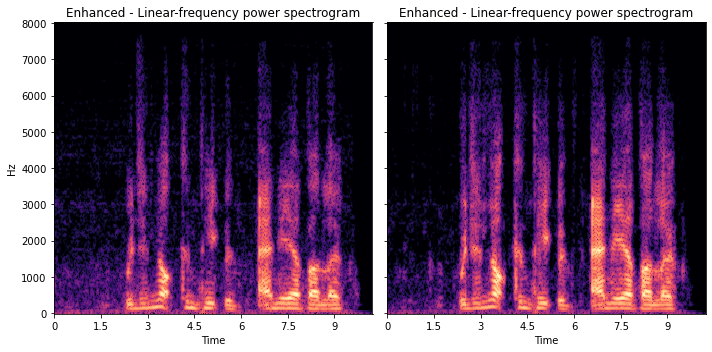

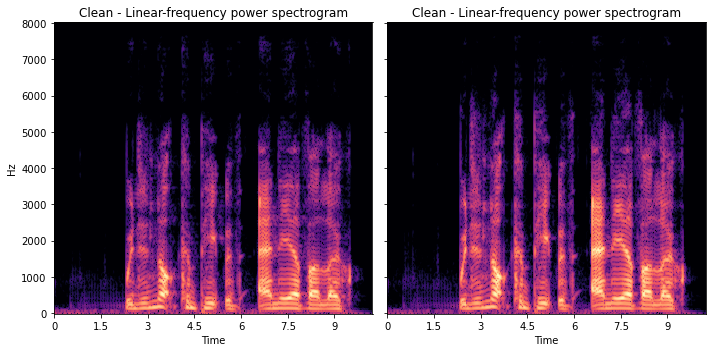

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 3 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


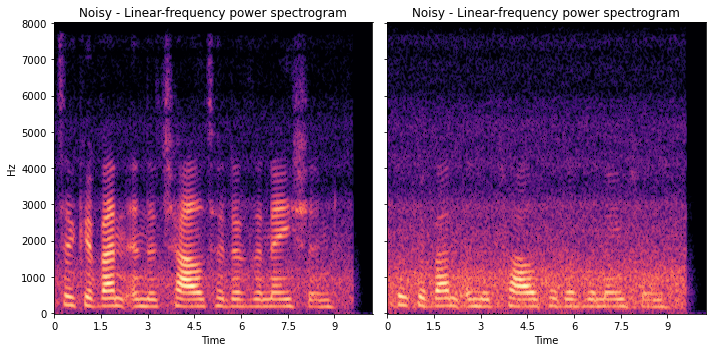

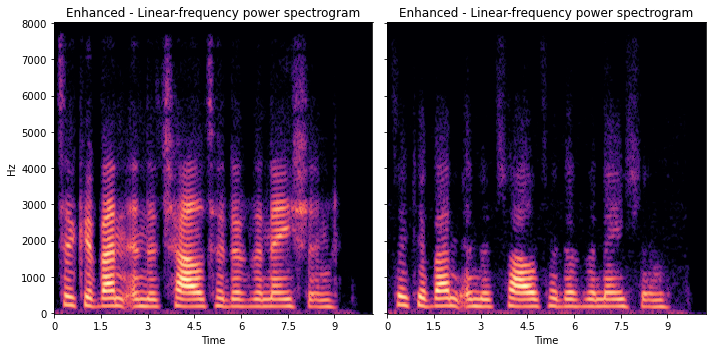

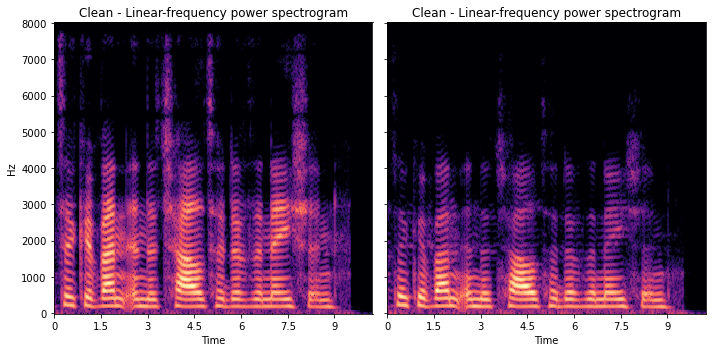

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 4 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


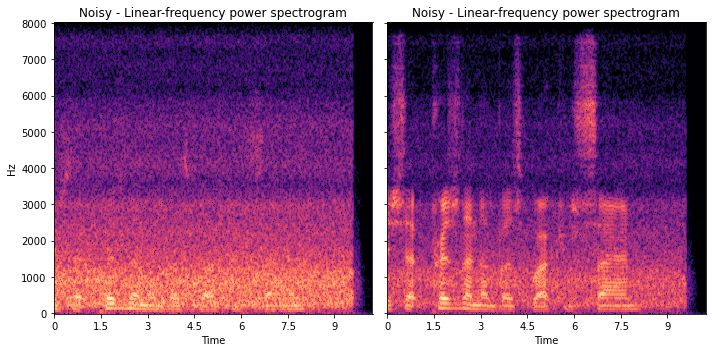

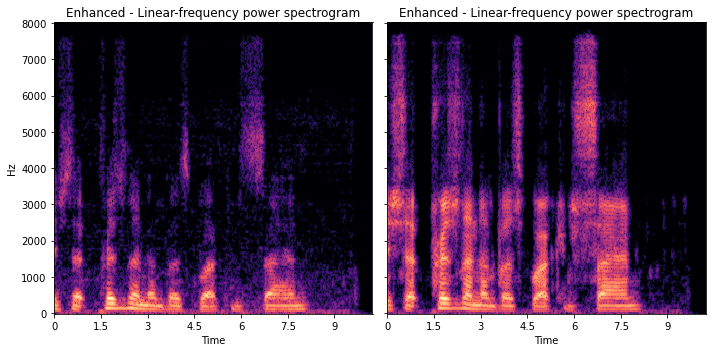

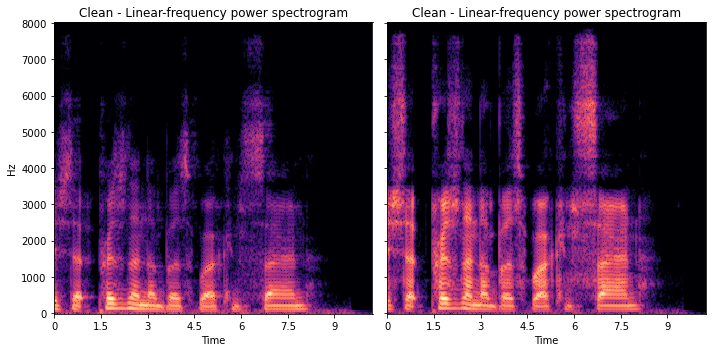

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 5 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


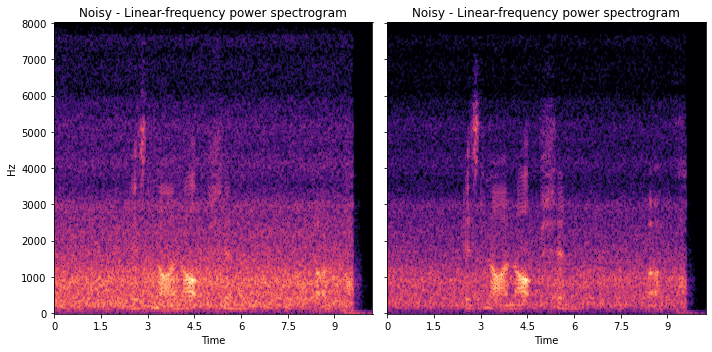

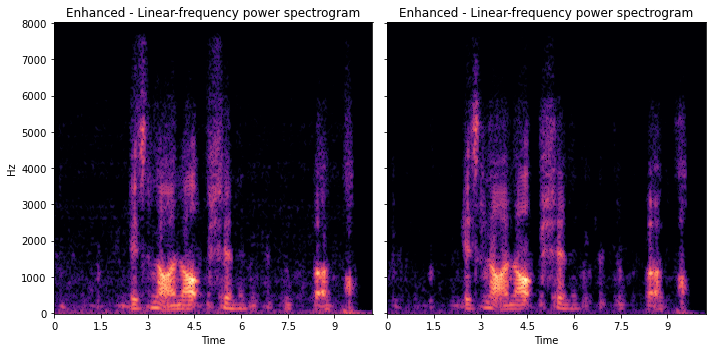

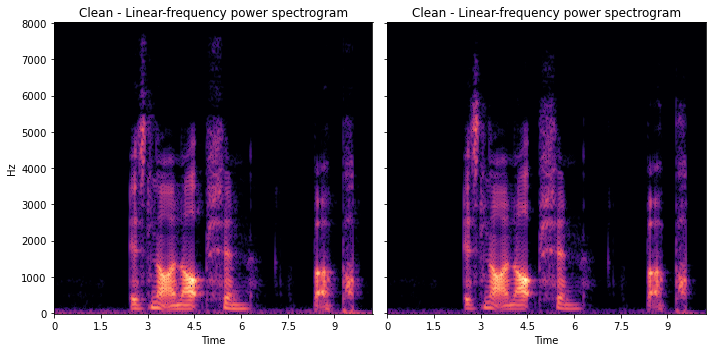

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 6 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


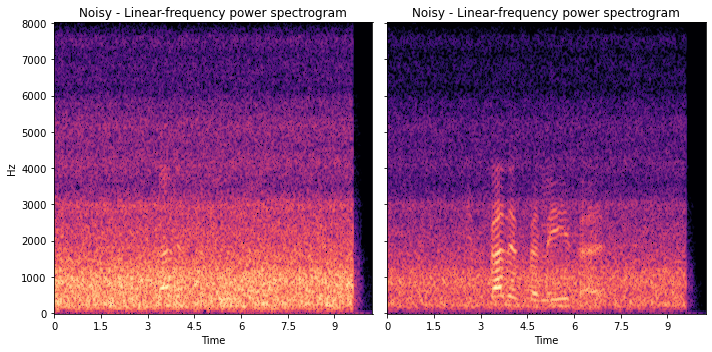

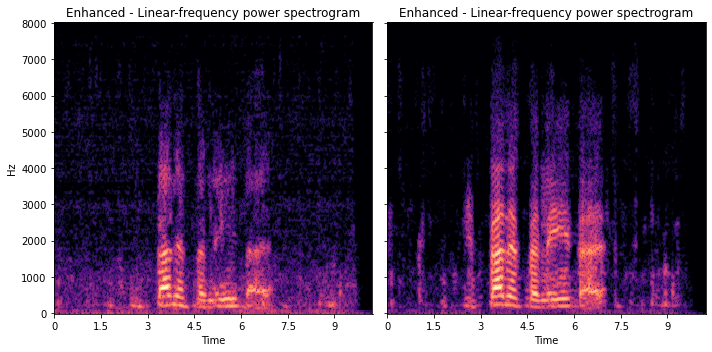

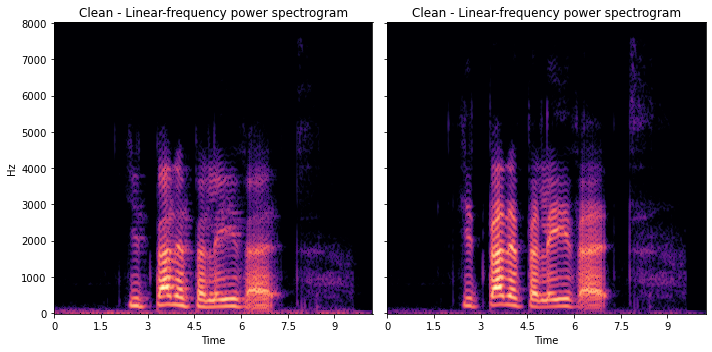

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 7 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


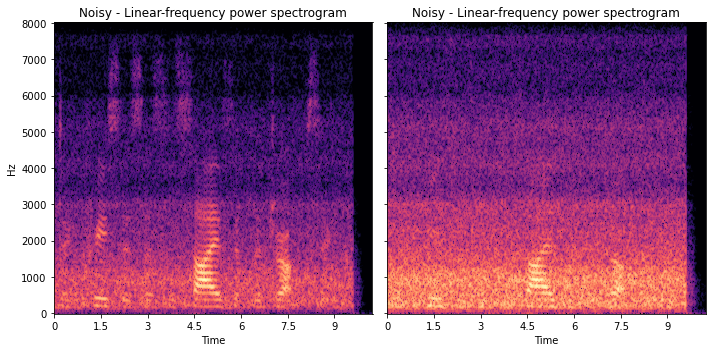

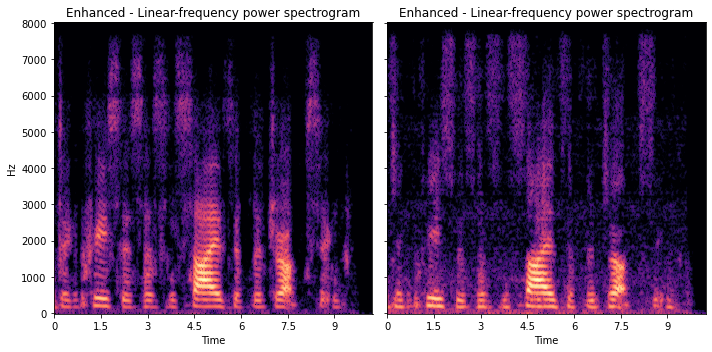

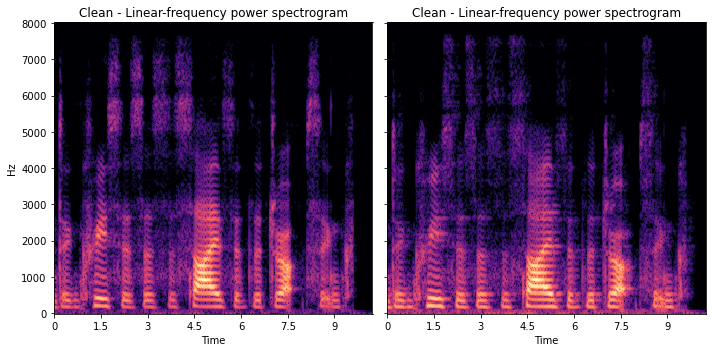

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 8 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


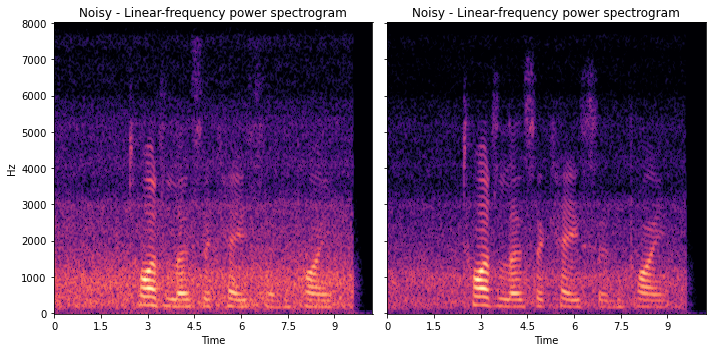

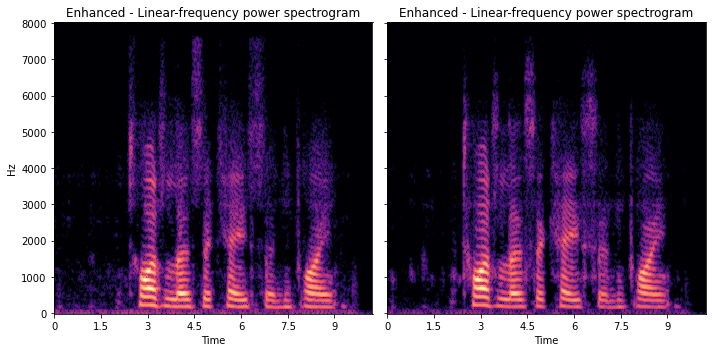

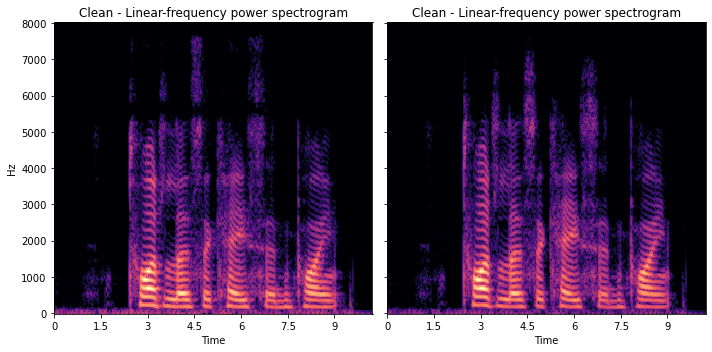

torch.Size([2, 32000])
torch.Size([1, 2, 32000])
===== Sample 9 =====
=== Noisy: ===


=== Enhanced: ===


=== Clean: ===


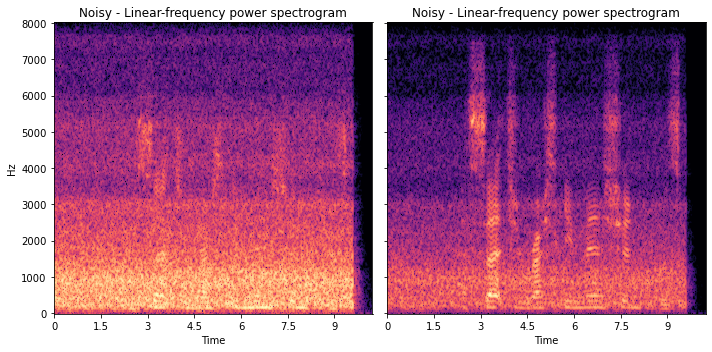

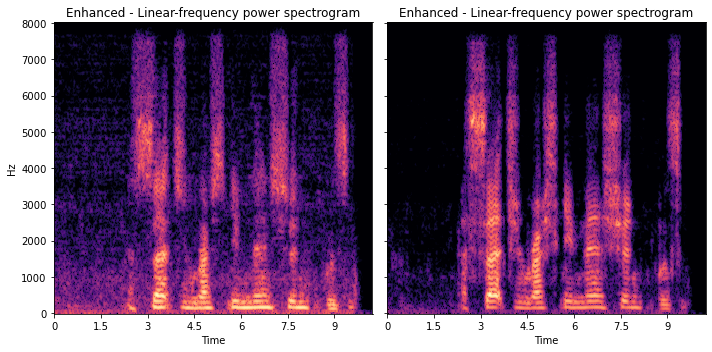

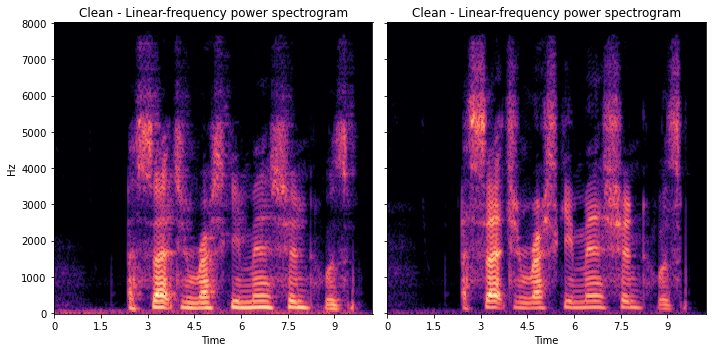

In [5]:
import IPython.display as ipd
import librosa.display
import matplotlib.pyplot as plt
from DCNN.datasets.base_dataset import BaseDataset
import numpy as np
from DCNN.feature_extractors import Stft, IStft
from torchmetrics.audio.stoi import ShortTimeObjectiveIntelligibility

NOISY_DATASET_PATH =  "/Users/vtokala/Documents/Research/Databases/Dataset_Binaural_2S/Isotropic_testset/SSN/Noisy_testset"
CLEAN_DATASET_PATH = '/Users/vtokala/Documents/Research/Databases/Dataset_Binaural_2S/Isotropic_testset/SSN/Clean_testset'
SR = 16000
EPS=1e-6

win_len = 400
win_inc = 100
fft_len = 512
fbins = int(fft_len/2 + 1)
# fbins=
avg_mode = 'freq'

stft = Stft(n_dft=fft_len, hop_size=win_inc, win_length=win_len)
istft = IStft(n_dft=fft_len, hop_size=win_inc, win_length=win_len)
stoi = ShortTimeObjectiveIntelligibility(fs=16000)
# amptodB = T.AmplitudeToDB(stype='amplitude')





dataset = BaseDataset(NOISY_DATASET_PATH, CLEAN_DATASET_PATH, mono=False)

dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=1,
    shuffle=True,
    pin_memory=True,
    drop_last=False,
    num_workers=2,
    
)

dataloader = iter(dataloader)

for i in range(10): # Enhance 10 samples
    try:
        batch = next(dataloader)
    except StopIteration:
        break
    print(batch[0][0].shape)
    noisy_samples = (batch[0])
    clean_samples = (batch[1])
    model_output = model(noisy_samples)[0].detach().cpu()
    print(noisy_samples.shape)
    print(f"===== Sample {i} =====")
    print(f"=== Noisy: ===")
    ipd.display(ipd.Audio(noisy_samples[0],rate=16000))
    print(f"=== Enhanced: ===")
    ipd.display(ipd.Audio(model_output,rate=16000))
    print(f"=== Clean: ===")
    ipd.display(ipd.Audio(clean_samples[0],rate=16000))
    
    noisy_samples = noisy_samples[0]
    clean_samples = clean_samples[0]
    
#     mask = bin_mask(10*torch.log10(((stft(clean_samples[0]).abs())**2 + (stft(clean_samples[1]).abs())**2) /2))
    
    fig, ax = plt.subplots(ncols=2, sharey=True, figsize=(10, 5))
    D = librosa.amplitude_to_db(np.abs(stft(noisy_samples[0]).numpy()), ref=np.max)
    img = librosa.display.specshow(D, y_axis='hz', x_axis='time',
                                   sr=16000, ax=ax[0])
    ax[0].set(title='Noisy - Linear-frequency power spectrogram')
    ax[0].label_outer()
    
    D = librosa.amplitude_to_db(np.abs(stft(noisy_samples[1]).numpy()), ref=np.max)
    img = librosa.display.specshow(D, y_axis='hz', x_axis='time',
                                   sr=16000, ax=ax[1])
    ax[1].set(title='Noisy - Linear-frequency power spectrogram')
    ax[1].label_outer()
    
    plt.tight_layout()
    plt.show()
    
    fig, ax = plt.subplots(ncols=2, sharey=True, figsize=(10, 5))
    D = librosa.amplitude_to_db(np.abs(stft(model_output[0]).numpy()), ref=np.max)
    img = librosa.display.specshow(D, y_axis='hz', x_axis='time',
                                   sr=16000, ax=ax[0])
    ax[0].set(title='Enhanced - Linear-frequency power spectrogram')
    ax[0].label_outer()
    
    D = librosa.amplitude_to_db(np.abs(stft(model_output[1]).numpy()), ref=np.max)
    img = librosa.display.specshow(D, y_axis='hz', x_axis='time',
                                   sr=16000, ax=ax[1])
    ax[1].set(title='Enhanced - Linear-frequency power spectrogram')
    ax[1].label_outer()
    
    plt.tight_layout()
    plt.show()
    
    fig, ax = plt.subplots(ncols=2, sharey=True, figsize=(10, 5))
    D = librosa.amplitude_to_db(np.abs(stft(clean_samples[0]).numpy()), ref=np.max)
    img = librosa.display.specshow(D, y_axis='hz', x_axis='time',
                                   sr=16000, ax=ax[0])
    ax[0].set(title='Clean - Linear-frequency power spectrogram')
    ax[0].label_outer()
    
    D = librosa.amplitude_to_db(np.abs(stft(clean_samples[1]).numpy()), ref=np.max)
    img = librosa.display.specshow(D, y_axis='linear', x_axis='time',
                                   sr=16000, ax=ax[1])
    ax[1].set(title='Clean - Linear-frequency power spectrogram')
    ax[1].label_outer()
    
    plt.tight_layout()
    plt.show()
    
#     fig, ax = plt.subplots(ncols=2, sharey=True, figsize=(10, 5))
#     D = librosa.amplitude_to_db(np.abs(stft(model_output[0]).numpy()), ref=np.max)
#     img = librosa.display.specshow(D*mask.numpy(), y_axis='hz', x_axis='time',
#                                    sr=16000, ax=ax[0])
#     ax[0].set(title='Masked Enhanced - Linear-frequency power spectrogram')
#     ax[0].label_outer()
    
#     D = librosa.amplitude_to_db(np.abs(stft(model_output[1]).numpy()), ref=np.max)
#     img = librosa.display.specshow(D*mask.numpy(), y_axis='hz', x_axis='time',
#                                    sr=16000, ax=ax[1])
#     ax[1].set(title='Masked Enhanced - Linear-frequency power spectrogram')
#     ax[1].label_outer()
    
#     plt.tight_layout()
#     plt.show()
    
#     fig, ax = plt.subplots(ncols=2, sharey=True, figsize=(10, 5))
# #     D = librosa.amplitude_to_db(np.abs(stft(model_output[0]).numpy()), ref=np.max)
#     img = librosa.display.specshow(mask.numpy(), y_axis='hz', x_axis='time',
#                                    sr=16000, ax=ax[0])
#     ax[0].set(title='Mask - Linear-frequency power spectrogram')
#     ax[0].label_outer()
    
# #     D = librosa.amplitude_to_db(np.abs(stft(model_output[1]).numpy()), ref=np.max)
#     img = librosa.display.specshow(mask.numpy(), y_axis='hz', x_axis='time',
#                                    sr=16000, ax=ax[1])
#     ax[1].set(title='Mask - Linear-frequency power spectrogram')
#     ax[1].label_outer()
    
#     plt.tight_layout()
#     plt.show()
    